In [1]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import glob
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score
import random


In [2]:
import sys
module_path = 'C:/Users/Dr. Raju Kharatkar/anaconda3/envs/MRI/Lib/site-packages/cv2'
sys.path.append(module_path)

import cv2

In [3]:
tumor = []
path = './brain_tumor_dataset/yes/*.jpg'
for f in glob.iglob(path):
    img = cv2.imread(f)
    img = cv2.resize(img,(128,128))
    b, g, r = cv2.split(img)
    img = cv2.merge([r, g, b])
    tumor.append(img)

In [4]:
healthy = []
path = './brain_tumor_dataset/no/*.jpg'
for f in glob.iglob(path):
    img = cv2.imread(f)
    img = cv2.resize(img,(128,128))
    b, g, r = cv2.split(img)
    img = cv2.merge([r, g, b])
    healthy.append(img)

In [5]:
healthy = np.array(healthy)
tumor = np.array(tumor)   
All = np.concatenate((healthy,tumor))

In [6]:
healthy.shape

(91, 128, 128, 3)

In [7]:
tumor.shape

(154, 128, 128, 3)

In [8]:
np.random.choice(10, 5, replace=False)

array([4, 2, 8, 0, 1])

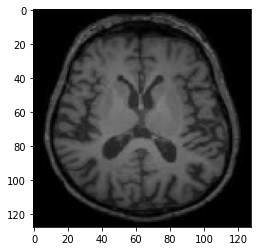

In [9]:
plt.imshow(healthy[0])

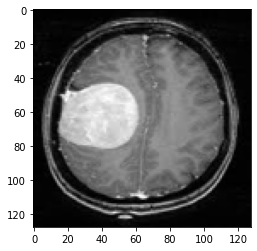

In [10]:
plt.imshow(tumor[0])

In [11]:
def plot_random(healthy,tumor,num=5):
    healthy_imgs = healthy[np.random.choice(healthy.shape[0],num,replace=False)]
    tumor_imgs = tumor[np.random.choice(tumor.shape[0],num,replace=False)]
    
    plt.figure(figsize=(16,9))
    for i in range(num):
        plt.subplot(1, num, i+1)
        plt.title('healthy')
        plt.imshow(healthy_imgs[i])
        
    plt.figure(figsize=(16,9))
    for i in range(num):
        plt.subplot(1, num, i+1)
        plt.title('tumor')
        plt.imshow(tumor_imgs[i])    
    

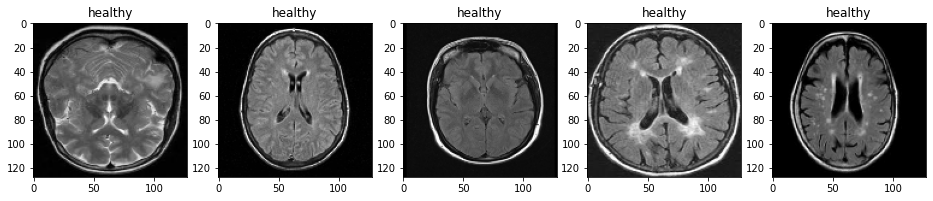

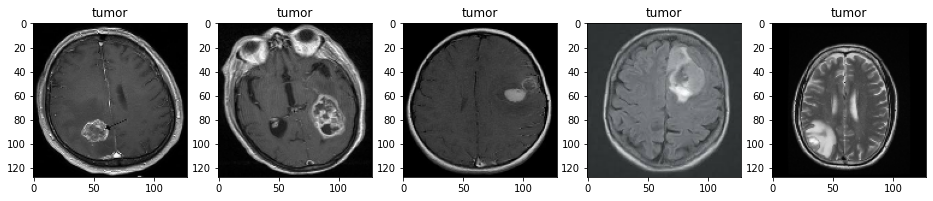

In [12]:
plot_random(healthy, tumor)

In [13]:
class Dataset(object):
    def __getitem__(self, index):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __add__(self, other):
        return ConcatDataset([self, other])

In [14]:
class MRI(Dataset):
    def __init__(self):
        
        tumor = []
        healthy = []
        # cv2 - It reads in BGR format by default
        for f in glob.iglob('./brain_tumor_dataset/yes/*.jpg'):
            img = cv2.imread(f)
            img = cv2.resize(img,(128,128)) # I can add this later in the boot-camp for more adventure
            b, g, r = cv2.split(img)
            img = cv2.merge([r,g,b])
            img = np.transpose(img,(2,0,1)) # otherwise the shape will be (h,w,#channels)
            tumor.append(img)

        for f in glob.iglob('./brain_tumor_dataset/no/*.jpg'):
            img = cv2.imread(f)
            img = cv2.resize(img,(128,128)) 
            b, g, r = cv2.split(img)
            img = cv2.merge([r,g,b])
            img = np.transpose(img,(2,0,1))
            healthy.append(img)
            
       # images
        tumor = np.array(tumor,dtype=np.float32)
        healthy = np.array(healthy,dtype=np.float32)
        
        # labels
        tumor_label = np.ones(tumor.shape[0], dtype=np.float32)
        healthy_label = np.zeros(healthy.shape[0], dtype=np.float32)
        
        # Concatenates
        self.images = np.concatenate((tumor, healthy), axis=0)
        self.labels = np.concatenate((tumor_label, healthy_label))
        
        
    def __len__(self):
        return self.images.shape[0]
    
    def __getitem__(self, index):
        
        sample = {'image': self.images[index], 'label':self.labels[index]}
        
        return sample
    
    def normalize(self):
        self.images = self.images/255.0  

In [15]:
mri = MRI()
mri.normalize()

In [16]:
len(mri)

245

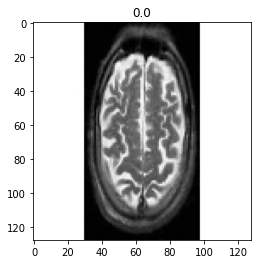

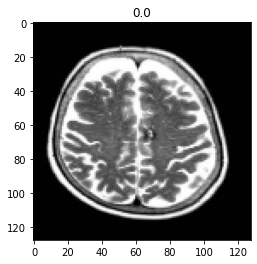

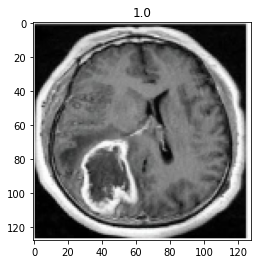

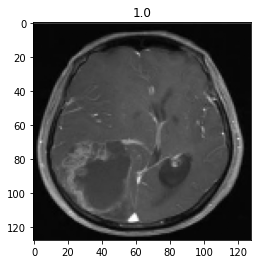

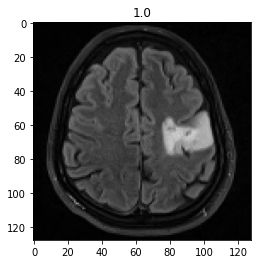

...

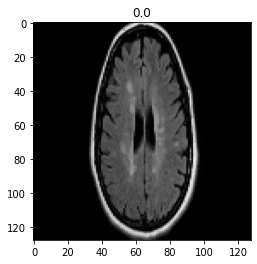

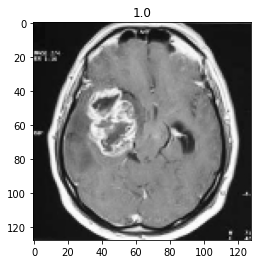

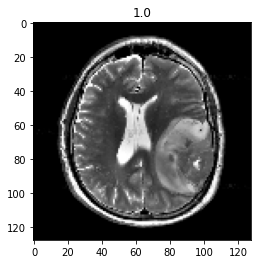

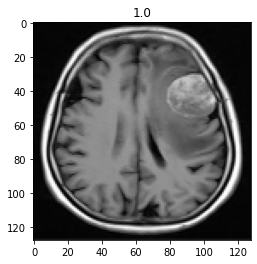

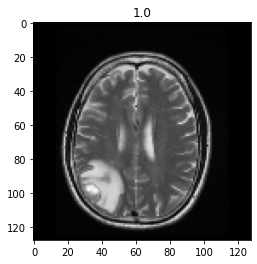

In [17]:
index = list(range(len(mri)))
random.shuffle(index)
for idx in index:
    sample = mri[idx]
    img = sample['image']
    label = sample['label']
    img = img.transpose((1, 2, 0))
    
    plt.title(label)
    plt.imshow(img)
    plt.show()

In [18]:
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module):
    def __init__(self):
        super(CNN,self).__init__()
        self.cnn_model = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5),
        nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5))
        
        self.fc_model = nn.Sequential(
        nn.Linear(in_features=256, out_features=120),
        nn.Tanh(),
        nn.Linear(in_features=120, out_features=84),
        nn.Tanh(),
        nn.Linear(in_features=84, out_features=1))
        
    def forward(self, x):
        x = self.cnn_model(x)
        x = x.view(x.size(0), -1)
        x = self.fc_model(x)
        x = F.sigmoid(x)
        
        return x

In [19]:
model= CNN()

In [20]:
model

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [21]:
model.cnn_model

Sequential(
  (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (1): Tanh()
  (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
  (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (4): Tanh()
  (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
)

In [22]:
model.cnn_model[0]

Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))

In [23]:
model.cnn_model[0].weight

Parameter containing:
tensor([[[[ 0.0003,  0.0140,  0.0166,  0.0474, -0.0697],
          [-0.0641, -0.0016,  0.0337, -0.0352, -0.0271],
          [-0.0996,  0.0016, -0.1153, -0.1108, -0.0846],
          [ 0.0802, -0.0945, -0.0547, -0.0808, -0.0343],
          [ 0.0509, -0.0401, -0.0652, -0.0205,  0.0979]],

         [[ 0.0462, -0.0077, -0.0928, -0.0819,  0.1141],
          [ 0.1073, -0.0705, -0.0449, -0.0196,  0.1048],
          [-0.0537, -0.1054, -0.0539,  0.0948,  0.0098],
          [ 0.0065, -0.0900,  0.0727,  0.0025,  0.0137],
          [ 0.0354,  0.1009, -0.0270,  0.1135, -0.0642]],

         [[ 0.0467,  0.0806,  0.0275,  0.0854,  0.1133],
          [ 0.0605, -0.0413,  0.0097,  0.0124, -0.1126],
          [-0.0590, -0.0482,  0.0448, -0.0284, -0.0525],
          [ 0.1017, -0.0230, -0.0139, -0.0670,  0.0539],
          [-0.0734, -0.0566, -0.0060,  0.0438, -0.0925]]],


        [[[ 0.1136, -0.0532,  0.0488,  0.0734,  0.0224],
          [-0.0721, -0.0925,  0.0675, -0.0032,  0.0137],
 

In [24]:
model.cnn_model[0].weight.shape

torch.Size([6, 3, 5, 5])

In [25]:
model.cnn_model[0].weight[0].shape

torch.Size([3, 5, 5])

In [26]:
model.cnn_model[0].weight[0][1]

tensor([[ 0.0462, -0.0077, -0.0928, -0.0819,  0.1141],
        [ 0.1073, -0.0705, -0.0449, -0.0196,  0.1048],
        [-0.0537, -0.1054, -0.0539,  0.0948,  0.0098],
        [ 0.0065, -0.0900,  0.0727,  0.0025,  0.0137],
        [ 0.0354,  0.1009, -0.0270,  0.1135, -0.0642]],
       grad_fn=<SelectBackward0>)

In [27]:
model.fc_model

Sequential(
  (0): Linear(in_features=256, out_features=120, bias=True)
  (1): Tanh()
  (2): Linear(in_features=120, out_features=84, bias=True)
  (3): Tanh()
  (4): Linear(in_features=84, out_features=1, bias=True)
)

In [28]:
model.fc_model[0]

Linear(in_features=256, out_features=120, bias=True)

In [29]:
model.fc_model[0].weight.shape

torch.Size([120, 256])

In [30]:
x = torch.tensor([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16])

In [31]:
x = x.reshape((2,2,2,2))

In [32]:
x

tensor([[[[ 1,  2],
          [ 3,  4]],

         [[ 5,  6],
          [ 7,  8]]],


        [[[ 9, 10],
          [11, 12]],

         [[13, 14],
          [15, 16]]]])

In [33]:
x.size(0)

2

In [34]:
x.view(-1)

tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])

In [35]:
x.view(x.size(0),-1).shape

torch.Size([2, 8])

In [36]:
# device will be 'cuda' if a GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# creating a CPU tensor
cpu_tensor = torch.rand(10).to(device)
# moving same tensor to GPU
gpu_tensor = cpu_tensor.to(device)

print(cpu_tensor, cpu_tensor.dtype, type(cpu_tensor), cpu_tensor.type())
print(gpu_tensor, gpu_tensor.dtype, type(gpu_tensor), gpu_tensor.type())

print(cpu_tensor*gpu_tensor)

tensor([0.2167, 0.1805, 0.8127, 0.3866, 0.2921, 0.7092, 0.6668, 0.6690, 0.9160,
        0.8111]) torch.float32 <class 'torch.Tensor'> torch.FloatTensor
tensor([0.2167, 0.1805, 0.8127, 0.3866, 0.2921, 0.7092, 0.6668, 0.6690, 0.9160,
        0.8111]) torch.float32 <class 'torch.Tensor'> torch.FloatTensor
tensor([0.0469, 0.0326, 0.6606, 0.1495, 0.0853, 0.5029, 0.4447, 0.4476, 0.8390,
        0.6579])


In [37]:
mri_dataset = MRI()
mri_dataset.normalize()
#device = torch.device('cuda:0')
model = CNN()

In [38]:
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)

In [39]:
model.eval()
outputs = []
y_true = []
with torch.no_grad():
    for D in dataloader:
        image = D['image']#.to(device)
        label = D['label']#.to(device)

        y_hat = model(image)

        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())

In [40]:
outputs = np.concatenate( outputs, axis=0 ).squeeze()
y_true = np.concatenate( y_true, axis=0 ).squeeze()

In [41]:
def threshold(scores,threshold=0.50, minimum=0, maximum = 1.0):
    x = np.array(list(scores))
    x[x >= threshold] = maximum
    x[x < threshold] = minimum
    return x

In [49]:
accuracy_score(y_true, threshold(outputs))

1.0

In [50]:
import sys
module_path = 'C:/Users/Dr. Raju Kharatkar/anaconda3/envs/MRI/Lib/site-packages/seaborn'
sys.path.append(module_path)

import seaborn

ModuleNotFoundError: No module named 'seaborn'

In [51]:
!pip install seaborn


You should consider upgrading via the 'C:\Users\Dr. Raju Kharatkar\anaconda3\envs\MRI\Scripts\python.exe -m pip install --upgrade pip' command.


In [52]:
import seaborn as sns

plt.figure(figsize=(16,9))
cm = confusion_matrix(y_true, threshold(outputs))
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, annot_kws={"size": 20})

# labels, title and ticks
ax.set_xlabel('Predicted labels', fontsize=20)
ax.set_ylabel('True labels', fontsize=20) 
ax.set_title('Confusion Matrix', fontsize=20)
ax.xaxis.set_ticklabels(['Healthy','Tumor'], fontsize=20)
ax.yaxis.set_ticklabels(['Tumor','Healthy'], fontsize=20)

ModuleNotFoundError: No module named 'seaborn'

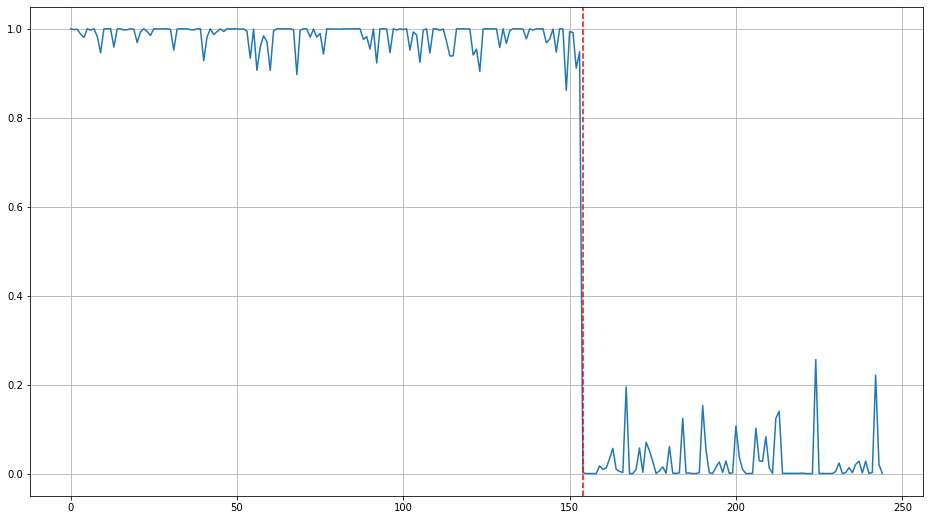

In [53]:
plt.figure(figsize=(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color='r', linestyle='--')
plt.grid()

In [54]:
eta = 0.0001
EPOCH = 400
optimizer = torch.optim.Adam(model.parameters(), lr=eta)
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=True)
model.train()

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [55]:
for epoch in range(1, EPOCH):
    losses = []
    for D in dataloader:
        optimizer.zero_grad()
        data = D['image'].to(device)
        label = D['label'].to(device)
        y_hat = model(data)
        # define loss function
        error = nn.BCELoss() 
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
    if (epoch+1) % 10 == 0:
        print('Train Epoch: {}\tLoss: {:.6f}'.format(epoch+1, np.mean(losses)))

Train Epoch: 10	Loss: 0.015489
Train Epoch: 20	Loss: 0.011285
Train Epoch: 30	Loss: 0.007680
Train Epoch: 40	Loss: 0.006149
Train Epoch: 50	Loss: 0.004349
Train Epoch: 60	Loss: 0.003241
Train Epoch: 70	Loss: 0.002551
Train Epoch: 80	Loss: 0.002221
Train Epoch: 90	Loss: 0.001710
Train Epoch: 100	Loss: 0.001363
Train Epoch: 110	Loss: 0.001098
Train Epoch: 120	Loss: 0.001030
Train Epoch: 130	Loss: 0.000813
Train Epoch: 140	Loss: 0.000707
Train Epoch: 150	Loss: 0.000625
Train Epoch: 160	Loss: 0.000558
Train Epoch: 170	Loss: 0.000471
Train Epoch: 180	Loss: 0.000428
Train Epoch: 190	Loss: 0.000377
Train Epoch: 200	Loss: 0.000363
Train Epoch: 210	Loss: 0.000314
Train Epoch: 220	Loss: 0.000280
Train Epoch: 230	Loss: 0.000255
Train Epoch: 240	Loss: 0.000227
Train Epoch: 250	Loss: 0.000213
Train Epoch: 260	Loss: 0.000183
Train Epoch: 270	Loss: 0.000171
Train Epoch: 280	Loss: 0.000156
Train Epoch: 290	Loss: 0.000151
Train Epoch: 300	Loss: 0.000138
Train Epoch: 310	Loss: 0.000124
Train Epoch: 320	

In [56]:
model.eval()
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)
outputs=[]
y_true = []
with torch.no_grad():
    for D in dataloader:
        image =  D['image'].to(device)
        label = D['label'].to(device)
        
        y_hat = model(image)
        
        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())
        
outputs = np.concatenate( outputs, axis=0 )
y_true = np.concatenate( y_true, axis=0 )

In [57]:
accuracy_score(y_true, threshold(outputs))

1.0

NameError: name 'sns' is not defined

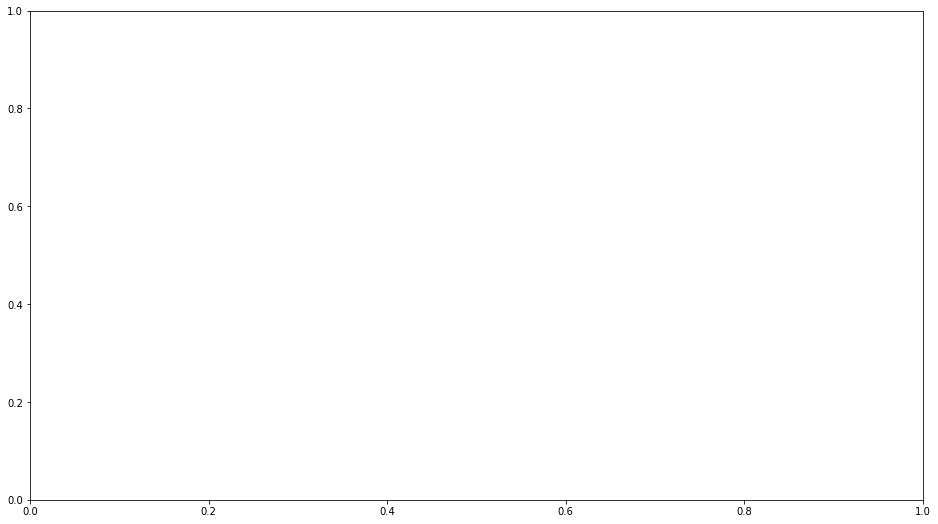

In [51]:
cm = confusion_matrix(y_true, threshold(outputs))
plt.figure(figsize=(16,9))

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Tumor','Healthy'])
ax.yaxis.set_ticklabels(['Tumor','Healthy'])

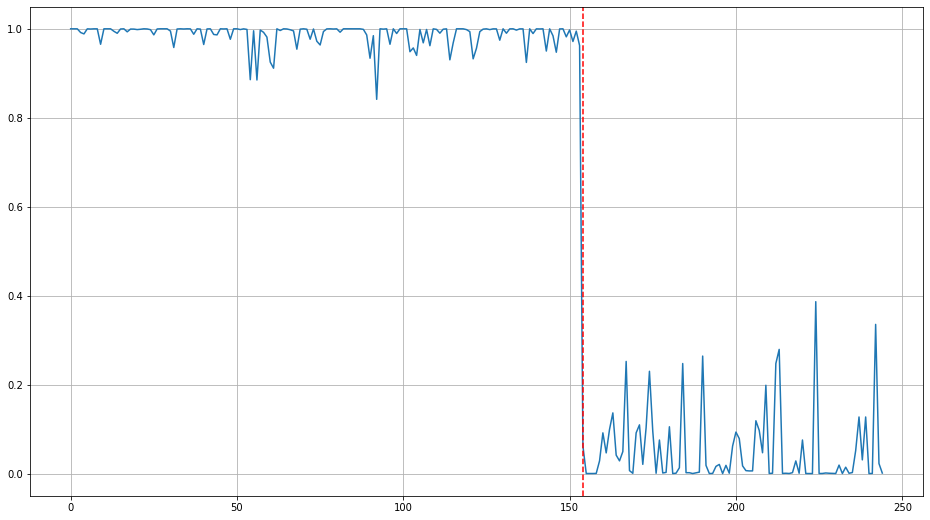

In [52]:
plt.figure(figsize=(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color='r', linestyle='--')
plt.grid()

In [53]:
model


CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [54]:
no_of_layers = 0
conv_layers = []

In [55]:
model_children = list(model.children())
model_children

[Sequential(
   (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
   (1): Tanh()
   (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
   (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
   (4): Tanh()
   (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
 ),
 Sequential(
   (0): Linear(in_features=256, out_features=120, bias=True)
   (1): Tanh()
   (2): Linear(in_features=120, out_features=84, bias=True)
   (3): Tanh()
   (4): Linear(in_features=84, out_features=1, bias=True)
 )]

In [56]:
for child in model_children:
    if type(child) == nn.Sequential:
        for layer in child.children():
            if type(layer) == nn.Conv2d:
                no_of_layers += 1
                conv_layers.append(layer)

In [57]:
conv_layers

[Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1)),
 Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))]

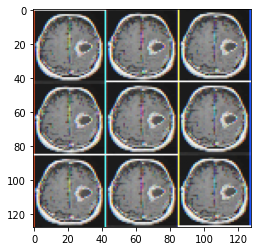

In [58]:
img = mri_dataset[100]['image']
plt.imshow(img.reshape(128,128,3))

In [59]:
img = torch.from_numpy(img).to(device)

In [60]:
img.shape

torch.Size([3, 128, 128])

In [61]:
img = img.unsqueeze(0)
img.shape

torch.Size([1, 3, 128, 128])

In [62]:
results = [conv_layers[0](img)]
for i in range(1, len(conv_layers)):
    results.append(conv_layers[i](results[-1]))
outputs = results

Layer  1


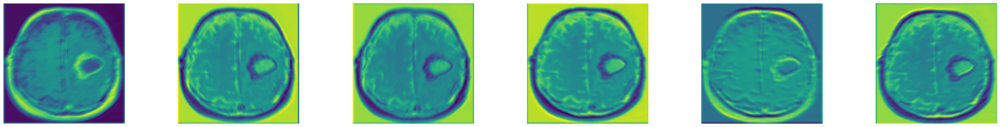

Layer  2


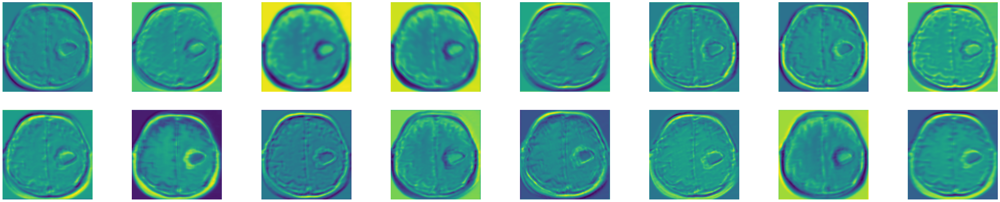

In [63]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(50, 10))
    layer_viz = outputs[num_layer].squeeze()
    print("Layer ",num_layer+1)
    for i, f in enumerate(layer_viz):
        plt.subplot(2, 8, i + 1)
        plt.imshow(f.detach().cpu().numpy())
        plt.axis("off")
    plt.show()
    plt.close()

In [64]:
from sklearn.model_selection import train_test_split

In [67]:
class MRI(Dataset):
    
    def __init__(self):
        
        # Variables to hold the Training data and Validation data
        self.X_train, self.y_train, self.X_val, self.y_val = None, None, None, None
        
        # A variable to determine if we are interested in retrieving the training OR the validation data
        self.mode = 'train'
        
        tumor = []
        healthy = []
        # cv2 - It reads in BGR format by default
        for f in glob.iglob("C:/Users/Dr. Raju Kharatkar/PycharmProjects/Brain Tumor Detection/brain_tumor_dataset/yes/*.jpg"):
            img = cv2.imread(f)
            img = cv2.resize(img,(128,128)) # I can add this later in the boot-camp for more adventure
            b, g, r = cv2.split(img)
            img = cv2.merge([r,g,b])
            img = img.reshape((img.shape[2],img.shape[0],img.shape[1])) # otherwise the shape will be (h,w,#channels)
            tumor.append(img)

        for f in glob.iglob("C:/Users/Dr. Raju Kharatkar/PycharmProjects/Brain Tumor Detection/brain_tumor_dataset/no/*.jpg"):
            img = cv2.imread(f)
            img = cv2.resize(img,(128,128)) 
            b, g, r = cv2.split(img)
            img = cv2.merge([r,g,b])
            img = img.reshape((img.shape[2],img.shape[0],img.shape[1]))
            healthy.append(img)

        # our images
        tumor = np.array(tumor,dtype=np.float32)
        healthy = np.array(healthy,dtype=np.float32)
        
        # our labels
        tumor_label = np.ones(tumor.shape[0], dtype=np.float32)
        healthy_label = np.zeros(healthy.shape[0], dtype=np.float32)
        
        # Concatenates
        self.images = np.concatenate((tumor, healthy), axis=0)
        self.labels = np.concatenate((tumor_label, healthy_label))
    
    # Define a function that would separate the data into Training and Validation sets
    def train_val_split(self):
        self.X_train, self.X_val, self.y_train, self.y_val = \
        train_test_split(self.images, self.labels, test_size=0.20, random_state=42)
        
    def __len__(self):
        # Use self.mode to deetrmine whether train or val data is of interest
        if self.mode == 'train':
            return self.X_train.shape[0]
        elif self.mode == 'val':
            return self.X_val.shape[0]
    
    def __getitem__(self, idx):
        # Use self.mode to deetrmine whether train or val data is of interest
        if self.mode== 'train':
            sample = {'image': self.X_train[idx], 'label': self.y_train[idx]}
        
        elif self.mode== 'val':
            sample = {'image': self.X_val[idx], 'label': self.y_val[idx]}
        
        return sample
    
    def normalize(self):
        self.images = self.images/255.0

In [68]:
mri_dataset = MRI()
mri_dataset.normalize()
mri_dataset.train_val_split()

In [69]:
train_dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)

In [70]:
model = CNN()

In [71]:
eta=0.0001
optimizer = torch.optim.Adam(model.parameters(), lr=eta)

In [72]:
epoch_train_loss = []
epoch_val_loss = []

In [73]:
for epoch in range(1,600):
    train_losses = []
    # train for the current epoch
    model.train()
    mri_dataset.mode = 'train'
    for D in train_dataloader:
        # Train the model
        optimizer.zero_grad()
        data = D['image'].to(device)
        label = D['label'].to(device)
        
        y_hat = model(data)
        error = nn.BCELoss()
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
    
    epoch_train_loss.append(np.mean(train_losses))
    
    # validate for the current epoch
    val_losses = []
    model.eval()
    
    mri_dataset.mode = 'val'
    
    with torch.no_grad():
        for D in val_dataloader:            
            data = D['image'].to(device)
            label = D['label'].to(device)
            y_hat = model(data)
            error = nn.BCELoss()
            loss = torch.sum(error(y_hat.squeeze(), label))
            val_losses.append(loss.item())
    
    epoch_val_loss.append(np.mean(val_losses))
    
    if (epoch+1) % 10 == 0:
        print('Train Epoch: {}\tTrain Loss: {:.6f}\tVal Loss: {:.6f} \t '.format(epoch+1, np.mean(train_losses),np.mean(val_losses)))
    

Train Epoch: 10	Train Loss: 0.663134	Val Loss: 0.600603
Train Epoch: 20	Train Loss: 0.609565	Val Loss: 0.589356
Train Epoch: 30	Train Loss: 0.596651	Val Loss: 0.567693
Train Epoch: 40	Train Loss: 0.565444	Val Loss: 0.556193
Train Epoch: 50	Train Loss: 0.547503	Val Loss: 0.551266
Train Epoch: 60	Train Loss: 0.504743	Val Loss: 0.552921
Train Epoch: 70	Train Loss: 0.489181	Val Loss: 0.562997
Train Epoch: 80	Train Loss: 0.452059	Val Loss: 0.582342
Train Epoch: 90	Train Loss: 0.422693	Val Loss: 0.593703
Train Epoch: 100	Train Loss: 0.420302	Val Loss: 0.626670
Train Epoch: 110	Train Loss: 0.377576	Val Loss: 0.661437
Train Epoch: 120	Train Loss: 0.372590	Val Loss: 0.677710
Train Epoch: 130	Train Loss: 0.400377	Val Loss: 0.692419
Train Epoch: 140	Train Loss: 0.525255	Val Loss: 0.692950
Train Epoch: 150	Train Loss: 0.341114	Val Loss: 0.687990
Train Epoch: 160	Train Loss: 0.319150	Val Loss: 0.721649
Train Epoch: 170	Train Loss: 0.373443	Val Loss: 0.721198
Train Epoch: 180	Train Loss: 0.384927	Va

In [ ]:
accuracy_score(y_true, threshold(outputs))

Text(0, 0.5, 'Loss')

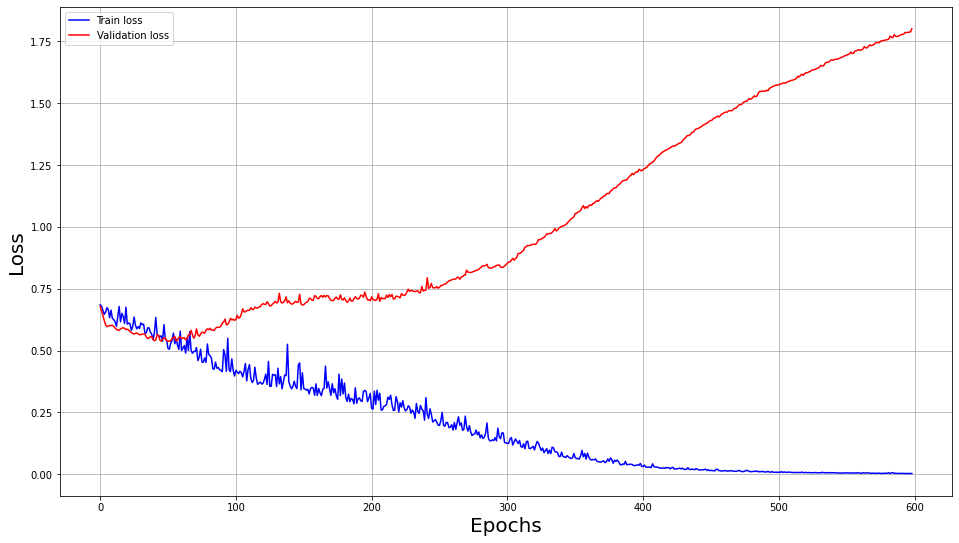

In [74]:
plt.figure(figsize=(16,9))
plt.plot(epoch_train_loss, c='b', label='Train loss')
plt.plot(epoch_val_loss, c='r', label = 'Validation loss')
plt.legend()
plt.grid()
plt.xlabel('Epochs', fontsize=20)
plt.ylabel('Loss', fontsize=20)

In [76]:
accuracy_score(y_true, threshold(outputs))

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.